In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import io
import requests
import sys

In [12]:
# reading the csv file

flights = pd.read_csv("flights.csv", low_memory=False)


In [13]:
# taking out first lakh entries

sample_flights = flights[:100000]
sample_flights

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,2354.0,-11.0,21.0,15.0,205,194.0,169.0,1448.0,404.0,4.0,430.0,408.0,-22.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,2.0,-8.0,12.0,14.0,280,279.0,263.0,2330.0,737.0,4.0,750.0,741.0,-9.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,18.0,-2.0,16.0,34.0,286,293.0,266.0,2296.0,800.0,11.0,806.0,811.0,5.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,15.0,-5.0,15.0,30.0,285,281.0,258.0,2342.0,748.0,8.0,805.0,756.0,-9.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,24.0,-1.0,11.0,35.0,235,215.0,199.0,1448.0,254.0,5.0,320.0,259.0,-21.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2015,1,7,3,EV,4992,N837AS,ATL,BQK,1108,1102.0,-6.0,23.0,1125.0,71,66.0,40.0,238.0,1205.0,3.0,1219.0,1208.0,-11.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
99996,2015,1,7,3,NK,394,N522NK,LAS,PHL,1108,1117.0,9.0,11.0,1128.0,274,267.0,248.0,2176.0,1836.0,8.0,1842.0,1844.0,2.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
99997,2015,1,7,3,OO,5606,N582SW,SFO,BFL,1108,1101.0,-7.0,28.0,1129.0,77,91.0,59.0,238.0,1228.0,4.0,1225.0,1232.0,7.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
99998,2015,1,7,3,UA,1135,N38473,ORD,MCO,1109,1116.0,7.0,26.0,1142.0,165,157.0,123.0,1005.0,1445.0,8.0,1454.0,1453.0,-1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# finding info about columns

sample_flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   YEAR                 100000 non-null  int64  
 1   MONTH                100000 non-null  int64  
 2   DAY                  100000 non-null  int64  
 3   DAY_OF_WEEK          100000 non-null  int64  
 4   AIRLINE              100000 non-null  object 
 5   FLIGHT_NUMBER        100000 non-null  int64  
 6   TAIL_NUMBER          99833 non-null   object 
 7   ORIGIN_AIRPORT       100000 non-null  object 
 8   DESTINATION_AIRPORT  100000 non-null  object 
 9   SCHEDULED_DEPARTURE  100000 non-null  int64  
 10  DEPARTURE_TIME       97702 non-null   float64
 11  DEPARTURE_DELAY      97702 non-null   float64
 12  TAXI_OUT             97629 non-null   float64
 13  WHEELS_OFF           97629 non-null   float64
 14  SCHEDULED_TIME       100000 non-null  int64  
 15  ELAPSED_TIME      

In [15]:
# counting the number of diverted flights
sample_flights['DIVERTED'].value_counts()

0.0    99776
1.0      224
Name: DIVERTED, dtype: int64

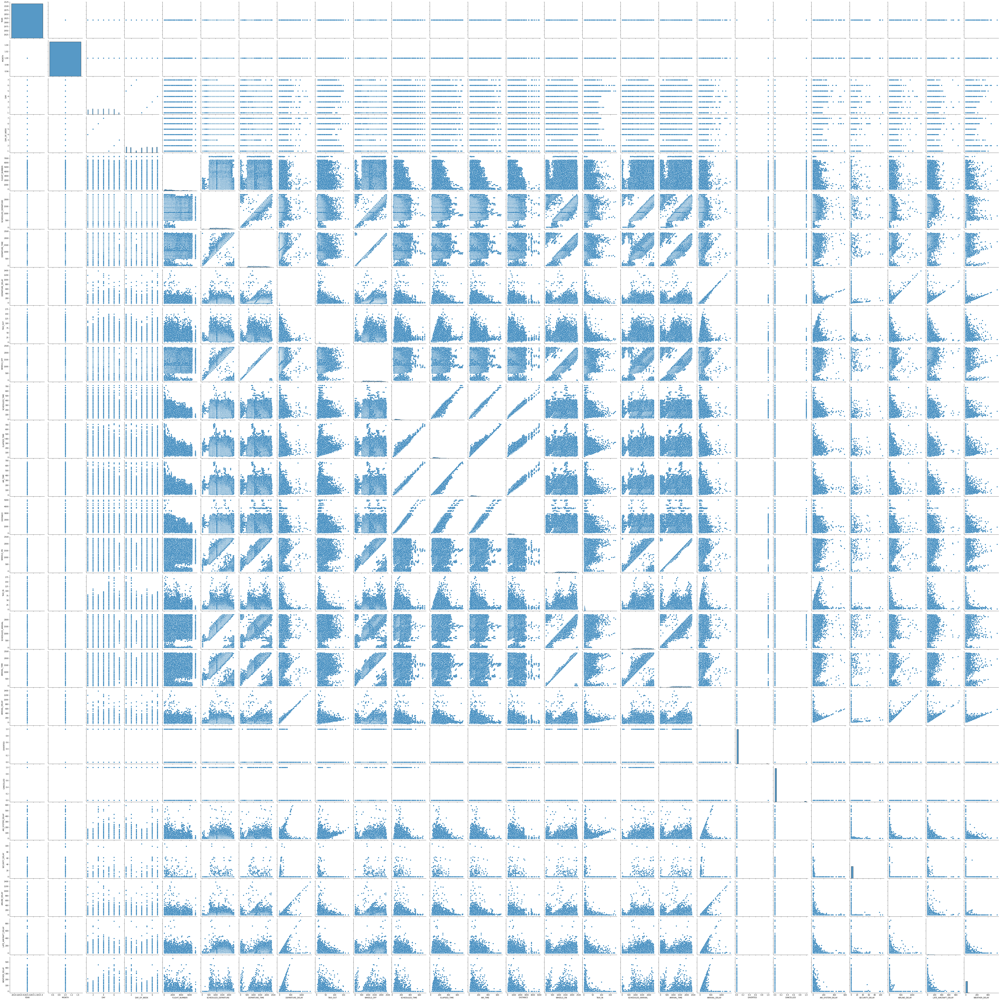

In [ ]:
# visualizing the correlation

sns.pairplot(sample_flights, height=3)

# the positive correlation found from these graphs:
# DEPARTURE_TIME => WHEELS_OFF
# DEPARTURE_DELAY => ARRIVAL_DELAY
# SCHEDULED_TIME => AIR_TIME
# SCHEDULED_TIME => ELAPSED_TIME
# SCHEDULED_TIME => DISTANCE
# ARRIVAL_TIME => WHEEL_ON
# ARRIVAL_DELAY => DEPARTURE_DELAY


In [17]:
# calculating correlation coe-efficient

correlation_matrix = sample_flights.corr()
correlation_matrix

,YEAR,MONTH,DAY,DAY_OF_WEEK,FLIGHT_NUMBER,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
YEAR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MONTH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DAY,NaN,NaN,1.000000,-0.497084,0.004412,-0.138130,-0.124369,0.060064,0.093451,-0.119781,-0.026285,-0.018470,-0.036330,-0.035208,-0.095731,0.037407,-0.110820,-0.091687,0.070770,0.004847,-0.006000,0.097693,-0.010550,-0.001603,0.033213,0.061960
DAY_OF_WEEK,NaN,NaN,-0.497084,1.000000,0.010955,0.046914,0.045182,0.055632,0.007291,0.044150,0.019755,0.029025,0.030678,0.024666,0.013749,-0.017789,0.031725,0.011477,0.067520,-0.000709,-0.006409,-0.019626,0.008156,0.003648,0.033729,-0.050835
FLIGHT_NUMBER,NaN,NaN,0.004412,0.010955,1.000000,-0.003027,0.010140,0.034863,0.061010,0.016377,-0.337801,-0.318819,-0.339135,-0.356196,-0.003670,0.014464,-0.018891,0.000753,0.056163,0.007155,0.090008,-0.032564,-0.007260,0.023770,0.076581,0.004246
SCHEDULED_DEPARTURE,NaN,NaN,-0.138130,0.046914,-0.003027,1.000000,0.943186,0.174254,-0.081496,0.912232,-0.019873,-0.025744,-0.011993,0.000321,0.585786,-0.027502,0.731240,0.552653,0.154951,0.002515,-0.002631,-0.112393,-0.017957,-0.054419,0.186286,-0.042004
DEPARTURE_TIME,NaN,NaN,-0.124369,0.045182,0.010140,0.943186,1.000000,0.243960,-0.070081,0.966477,-0.031873,-0.035204,-0.024384,-0.016562,0.618850,-0.017759,0.734970,0.584615,0.223654,0.006576,0.009679,-0.093096,-0.012820,-0.013304,0.247325,-0.046406
DEPARTURE_DELAY,NaN,NaN,0.060064,0.055632,0.034863,0.174254,0.243960,1.000000,0.061905,0.231399,0.005868,0.015257,0.002733,0.004591,0.090696,0.040285,0.155150,0.079639,0.950838,0.020787,0.030862,0.085794,0.008040,0.606954,0.605289,0.210402
TAXI_OUT,NaN,NaN,0.093451,0.007291,0.061010,-0.081496,-0.070081,0.061905,1.000000,-0.043114,0.096191,0.215749,0.077234,0.057871,-0.045096,0.009041,-0.062325,-0.045611,0.245363,0.009810,0.010763,0.407371,-0.008021,-0.024674,-0.129879,0.119412
WHEELS_OFF,NaN,NaN,-0.119781,0.044150,0.016377,0.912232,0.966477,0.231399,-0.043114,1.000000,-0.038173,-0.038217,-0.031646,-0.027282,0.642358,-0.015089,0.744697,0.608611,0.217344,0.006524,0.001293,-0.085582,-0.013912,-0.017376,0.223010,-0.055273


In [24]:
# removing the features that are redundant or have less correlation

sample_flights = sample_flights.drop(['YEAR', 'FLIGHT_NUMBER', 'AIRLINE', 'DISTANCE', 'TAIL_NUMBER', 'TAXI_OUT', 'SCHEDULED_TIME', 'DEPARTURE_TIME', 'WHEELS_OFF', 'ELAPSED_TIME', 'AIR_TIME', 'WHEELS_ON', 'DAY_OF_WEEK', 'TAXI_IN', 'ARRIVAL_TIME', 'CANCELLATION_REASON'], axis=1)
sample_flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   MONTH                100000 non-null  int64  
 1   DAY                  100000 non-null  int64  
 2   ORIGIN_AIRPORT       100000 non-null  object 
 3   DESTINATION_AIRPORT  100000 non-null  object 
 4   SCHEDULED_DEPARTURE  100000 non-null  int64  
 5   DEPARTURE_DELAY      97702 non-null   float64
 6   SCHEDULED_ARRIVAL    100000 non-null  float64
 7   ARRIVAL_DELAY        97387 non-null   float64
 8   DIVERTED             100000 non-null  float64
 9   CANCELLED            100000 non-null  float64
 10  AIR_SYSTEM_DELAY     34625 non-null   float64
 11  SECURITY_DELAY       34625 non-null   float64
 12  AIRLINE_DELAY        34625 non-null   float64
 13  LATE_AIRCRAFT_DELAY  34625 non-null   float64
 14  WEATHER_DELAY        34625 non-null   float64
dtypes: float64(10), in

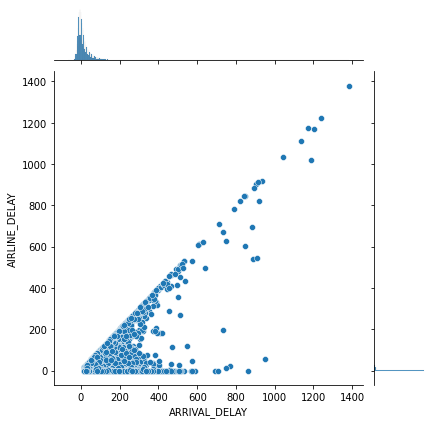

In [28]:
sns.jointplot(data=sample_flights, x="ARRIVAL_DELAY", y="AIRLINE_DELAY")

In [41]:
# fill out NAN values with respective mean values

sample_flights = sample_flights.fillna(sample_flights.mean())
sample_flights.head()

,MONTH,DAY,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_DELAY,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,1,1,ANC,SEA,5,-11.0,430.0,-22.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971
1,1,1,LAX,PBI,10,-8.0,750.0,-9.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971
2,1,1,SFO,CLT,20,-2.0,806.0,5.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971
3,1,1,LAX,MIA,20,-5.0,805.0,-9.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971
4,1,1,SEA,ANC,25,-1.0,320.0,-21.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971


In [47]:
# creating resulting column

sample_flights['RESULT'] = sample_flights.apply(lambda x: 1 if (x.ARRIVAL_DELAY>15) else 0, axis = 1) 
sample_flights["RESULT"].value_counts()

0    63779
1    36221
Name: RESULT, dtype: int64

In [50]:
# preparing data to fit model

model_data = sample_flights.drop(['ORIGIN_AIRPORT', 'DESTINATION_AIRPORT', 'ARRIVAL_DELAY'], axis=1)
model_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   MONTH                100000 non-null  int64  
 1   DAY                  100000 non-null  int64  
 2   SCHEDULED_DEPARTURE  100000 non-null  int64  
 3   DEPARTURE_DELAY      100000 non-null  float64
 4   SCHEDULED_ARRIVAL    100000 non-null  float64
 5   DIVERTED             100000 non-null  float64
 6   CANCELLED            100000 non-null  float64
 7   AIR_SYSTEM_DELAY     100000 non-null  float64
 8   SECURITY_DELAY       100000 non-null  float64
 9   AIRLINE_DELAY        100000 non-null  float64
 10  LATE_AIRCRAFT_DELAY  100000 non-null  float64
 11  WEATHER_DELAY        100000 non-null  float64
 12  RESULT               100000 non-null  int64  
dtypes: float64(9), int64(4)
memory usage: 9.9 MB


In [63]:
# Seperating X (input) and Y (output) variables

X = model_data.drop(['RESULT'], axis=1)
X.info()
y = model_data["RESULT"]
y.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   MONTH                100000 non-null  int64  
 1   DAY                  100000 non-null  int64  
 2   SCHEDULED_DEPARTURE  100000 non-null  int64  
 3   DEPARTURE_DELAY      100000 non-null  float64
 4   SCHEDULED_ARRIVAL    100000 non-null  float64
 5   DIVERTED             100000 non-null  float64
 6   CANCELLED            100000 non-null  float64
 7   AIR_SYSTEM_DELAY     100000 non-null  float64
 8   SECURITY_DELAY       100000 non-null  float64
 9   AIRLINE_DELAY        100000 non-null  float64
 10  LATE_AIRCRAFT_DELAY  100000 non-null  float64
 11  WEATHER_DELAY        100000 non-null  float64
dtypes: float64(9), int64(3)
memory usage: 9.2 MB


0    0
1    0
2    0
3    0
4    0
Name: RESULT, dtype: int64

In [67]:
# splitting train set and test set

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train.head()

,MONTH,DAY,SCHEDULED_DEPARTURE,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
76513,1,5,1905,52.0,2045.0,0.0,0.0,8.000000,0.000000,3.000000,49.000000,0.000000
60406,1,4,1945,5.0,2040.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971
27322,1,2,1822,26.0,2311.0,0.0,0.0,0.000000,0.000000,16.000000,0.000000,0.000000
53699,1,4,1300,22.0,1615.0,0.0,0.0,0.000000,0.000000,0.000000,2.000000,15.000000
65412,1,5,810,7.0,930.0,0.0,0.0,14.026801,0.070787,17.853921,26.014556,2.751971


In [71]:
# feature scaling

from sklearn.preprocessing import StandardScaler

scaler  = StandardScaler()
X_scaled_train = scaler.fit_transform(X_train)
X_scaled_test = scaler.fit_transform(X_test)

In [73]:
# training the model using Decision Tree Classifier

from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(random_state=0)
clf = clf.fit(X_scaled_train, y_train)
y_pred = clf.predict(X_scaled_test)

In [74]:
# calculating accuracy

from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, y_pred)


0.9935169469509344